In [1]:
# Importing necessary libraries
import json
import pandas as pd
import os
import matplotlib.pyplot as plt
from skimage.io import imread
from matplotlib.collections import PatchCollection
from matplotlib.patches import Rectangle
import numpy as np
import itertools

In [26]:
map_base_dir = '../../model/data/instance-segmentation'
map_img_dir = '../../model/data/instance-segmentation/train/images/'
output_dir = '../../model/data/instance-segmentation/train/annotated-images/'

In [28]:
os.makedirs(output_dir, exist_ok=True)

In [3]:
json_path = os.path.join(map_base_dir, 'annotation.json')

In [4]:
# Loads the annotation data for the images from a JSON file
with open(json_path, 'r') as f:
    annot_data = json.load(f)

In [5]:
type(annot_data)

dict

In [5]:
annot_data.keys()

dict_keys(['info', 'categories', 'images', 'annotations'])

In [6]:
for i, x in enumerate(list(annot_data['images'])):
    if(i < 5):
        print(x)

{'id': 239047, 'file_name': '000000239047.jpg', 'width': 300, 'height': 300}
{'id': 37213, 'file_name': '000000037213.jpg', 'width': 300, 'height': 300}
{'id': 115886, 'file_name': '000000115886.jpg', 'width': 300, 'height': 300}
{'id': 135786, 'file_name': '000000135786.jpg', 'width': 300, 'height': 300}
{'id': 75474, 'file_name': '000000075474.jpg', 'width': 300, 'height': 300}


In [7]:
# Creates a DataFrame from the image data 
image_df = pd.DataFrame(annot_data['images'])
image_df.sample(3)

,id,file_name,width,height
15296,70039,000000070039.jpg,300,300
45839,163214,000000163214.jpg,300,300
82540,246758,000000246758.jpg,300,300


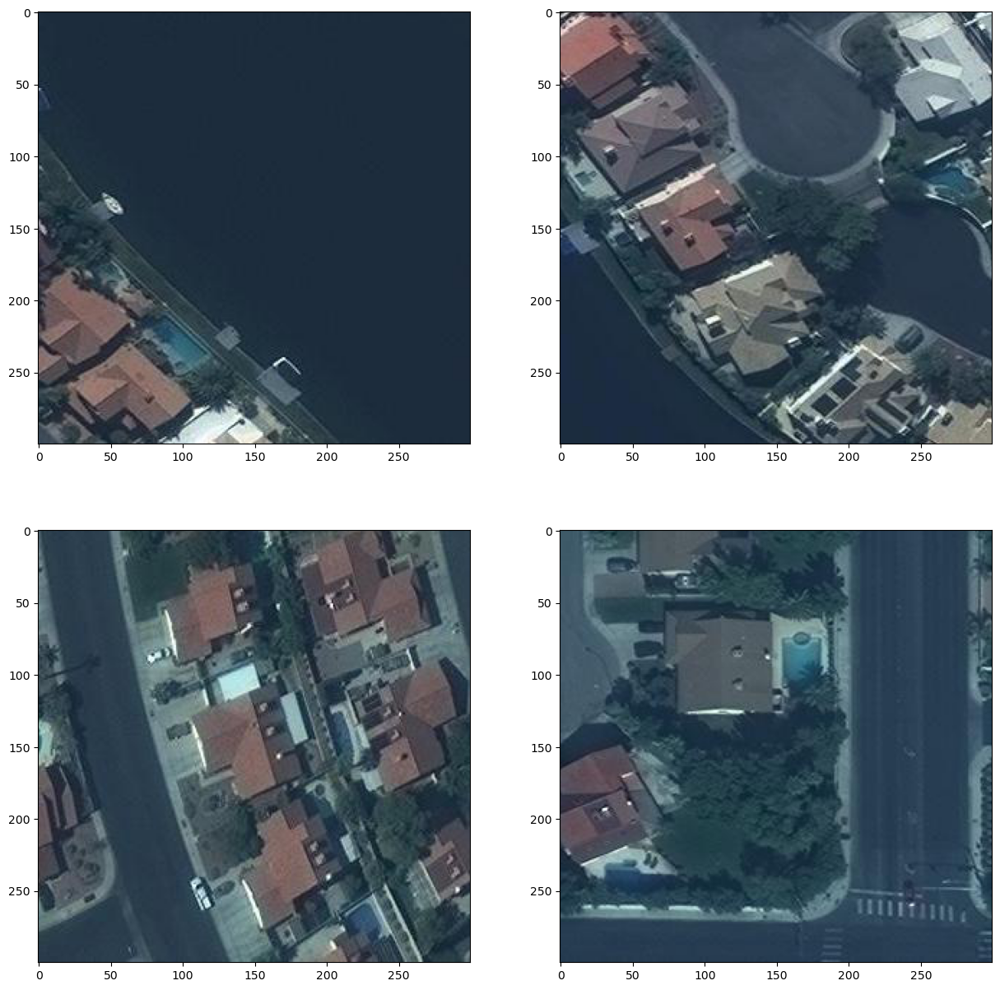

In [8]:
# Visualizes a few sample images from the dataset.
fig, m_axs = plt.subplots(2, 2, figsize = (15, 15 )) #m_axs is 2x2 array that conatains 4 axes

# Using 'm_axs.flatten() converts that 2D array into 1D array so we can iterate through all the subplots using a single loop
for c_ax, (_, c_row) in zip(m_axs.flatten(), image_df.sample(4).iterrows()):
    img_data = imread(os.path.join(map_img_dir, c_row['file_name']))
    c_ax.imshow(img_data)

In [9]:
# Creates a DataFrame from annotations data 
annot_df = pd.DataFrame(annot_data['annotations'])
annot_df.sample(3)

,id,image_id,segmentation,area,bbox,category_id,iscrowd
1648235,1530720,179569,"[[153, 299, 153, 300, 121, 300, 121, 299, 153,...",32.0,"[121, 121, 179, 32]",100,0
689371,610728,71627,"[[180.0, 189.0, 180.0, 183.0, 175.0, 183.0, 15...",2790.0,"[137.0, 152.0, 52.0, 66.0]",100,0
260534,890822,104559,"[[0.0, 206.0, 18.0, 245.0, 0.0, 258.0, 0.0, 20...",470.0,"[0.0, 0.0, 245.0, 18.0]",100,0


In [10]:
annot_df.head()

,id,image_id,segmentation,area,bbox,category_id,iscrowd
0,460757,54062,"[[300, 182, 297, 182, 296, 153, 300, 153, 300,...",101.0,"[182, 296, 118, 4]",100,0
1,266461,31255,"[[19.0, 234.0, 19.0, 245.0, 0.0, 246.0, 0.0, 2...",218.0,"[0.0, 0.0, 245.0, 19.0]",100,0
2,313854,36754,"[[133.0, 42.0, 133.0, 4.000000000000001, 197.0...",2432.0,"[4.000000000000001, 133.0, 193.0, 64.0]",100,0
3,278729,32649,"[[125.0, 247.0, 125.0, 300.0, 37.0, 300.0, 36....",4647.0,"[37.0, 36.0, 263.0, 89.0]",100,0
4,509969,59769,"[[200.0, 300.0, 212.0, 280.0, 227.0, 293.0, 23...",4122.0,"[200.0, 200.0, 100.0, 92.0]",100,0


In [11]:
image_df.head()

,id,file_name,width,height
0,239047,000000239047.jpg,300,300
1,37213,000000037213.jpg,300,300
2,115886,000000115886.jpg,300,300
3,135786,000000135786.jpg,300,300
4,75474,000000075474.jpg,300,300


In [12]:
# Left join to combine annot_df and image_df tables togather 
# Using dropna() remove all the rows that contains NaN
full_df = pd.merge(annot_df, image_df, how='left', left_on = 'image_id', right_on='id').dropna()

In [13]:
# Exsample
print(image_df.shape[0], '+', annot_df.shape[0], '->', full_df.shape[0])

280741 + 2395553 -> 2395553


In [14]:
full_df.head()

,id_x,image_id,segmentation,area,bbox,category_id,iscrowd,id_y,file_name,width,height
0,460757,54062,"[[300, 182, 297, 182, 296, 153, 300, 153, 300,...",101.0,"[182, 296, 118, 4]",100,0,54062,000000054062.jpg,300,300
1,266461,31255,"[[19.0, 234.0, 19.0, 245.0, 0.0, 246.0, 0.0, 2...",218.0,"[0.0, 0.0, 245.0, 19.0]",100,0,31255,000000031255.jpg,300,300
2,313854,36754,"[[133.0, 42.0, 133.0, 4.000000000000001, 197.0...",2432.0,"[4.000000000000001, 133.0, 193.0, 64.0]",100,0,36754,000000036754.jpg,300,300
3,278729,32649,"[[125.0, 247.0, 125.0, 300.0, 37.0, 300.0, 36....",4647.0,"[37.0, 36.0, 263.0, 89.0]",100,0,32649,000000032649.jpg,300,300
4,509969,59769,"[[200.0, 300.0, 212.0, 280.0, 227.0, 293.0, 23...",4122.0,"[200.0, 200.0, 100.0, 92.0]",100,0,59769,000000059769.jpg,300,300


In [15]:
def create_boxes(in_rows):
    box_list = []
    for _, in_row in in_rows.iterrows():
        # bbox from the coco standard
        (start_y, start_x, wid_y, wid_x) = in_row['bbox']
        
        box_list += [Rectangle((start_x, start_y), 
                         wid_y , wid_x
                         )]
    return box_list

In [16]:
full_df.groupby('image_id')

In [17]:
# Group the full_dt based on image_id.
# Group by function same as groupBy in mySql 
grouped = full_df.groupby('image_id')

for i, (key, value) in enumerate(grouped):
        print(f"-------IMAGE ID  {key}--------")
        x[i] = pd.DataFrame(value)

-------IMAGE ID  0--------
-------IMAGE ID  1--------
-------IMAGE ID  2--------
-------IMAGE ID  3--------
-------IMAGE ID  4--------
-------IMAGE ID  5--------
-------IMAGE ID  6--------
-------IMAGE ID  7--------
-------IMAGE ID  8--------
-------IMAGE ID  9--------
-------IMAGE ID  10--------
-------IMAGE ID  11--------
-------IMAGE ID  12--------
-------IMAGE ID  13--------
-------IMAGE ID  14--------
-------IMAGE ID  15--------
-------IMAGE ID  16--------
-------IMAGE ID  17--------
-------IMAGE ID  18--------
-------IMAGE ID  19--------
-------IMAGE ID  20--------
-------IMAGE ID  21--------
-------IMAGE ID  22--------
-------IMAGE ID  23--------
-------IMAGE ID  24--------
-------IMAGE ID  25--------
-------IMAGE ID  26--------
-------IMAGE ID  27--------
-------IMAGE ID  28--------
-------IMAGE ID  29--------
-------IMAGE ID  30--------
-------IMAGE ID  31--------
-------IMAGE ID  32--------
-------IMAGE ID  33--------
-------IMAGE ID  34--------
-------IMAGE ID  35--------
--

In [18]:
x[2]

,id_x,image_id,segmentation,area,bbox,category_id,iscrowd,id_y,file_name,width,height
73371,22,2,"[[93.0, 287.0, 83.0, 287.0, 83.0, 300.0, 34.0,...",3044.0,"[26.0, 26.0, 274.0, 67.0]",100,0,2,000000000002.jpg,300,300
166437,17,2,"[[300.0, 231.0, 273.0, 232.0, 273.0, 201.0, 28...",938.0,"[201.0, 273.0, 99.0, 27.0]",100,0,2,000000000002.jpg,300,300
329608,27,2,"[[182.0, 50.0, 140.0, 50.0, 140.0, 31.0, 135.0...",1843.0,"[15.0, 135.0, 167.0, 48.0]",100,0,2,000000000002.jpg,300,300
334082,19,2,"[[80.0, 111.0, 29.0, 114.00000000000001, 28.0,...",2268.0,"[28.0, 28.0, 86.00000000000001, 59.0]",100,0,2,000000000002.jpg,300,300
392566,21,2,"[[84.0, 237.0, 29.0, 238.0, 28.0, 197.0, 39.0,...",2632.0,"[28.0, 28.0, 210.0, 56.0]",100,0,2,000000000002.jpg,300,300
491199,23,2,"[[129.0, 300.0, 129.0, 249.0, 178.0, 250.0, 17...",2718.0,"[129.0, 129.0, 171.0, 58.0]",100,0,2,000000000002.jpg,300,300
559718,24,2,"[[185.0, 224.0, 167.0, 224.0, 167.0, 234.0, 13...",2411.0,"[128.0, 128.0, 106.0, 60.0]",100,0,2,000000000002.jpg,300,300
581366,14,2,"[[300.0, 106.99999999999999, 274.0, 106.999999...",863.0,"[80.99999999999999, 274.0, 219.0, 26.0]",100,0,2,000000000002.jpg,300,300
779595,15,2,"[[271.0, 148.0, 271.0, 115.99999999999999, 300...",1024.0,"[115.99999999999999, 271.0, 184.0, 29.0]",100,0,2,000000000002.jpg,300,300
876236,26,2,"[[185.0, 91.0, 178.0, 91.0, 178.0, 114.0, 131....",2647.0,"[91.0, 131.0, 94.0, 54.0]",100,0,2,000000000002.jpg,300,300


In [39]:
# xy_vec = np.array(x[2]['segmentation']).reshape((-1, 2))

ValueError: cannot reshape array of size 15 into shape (2)

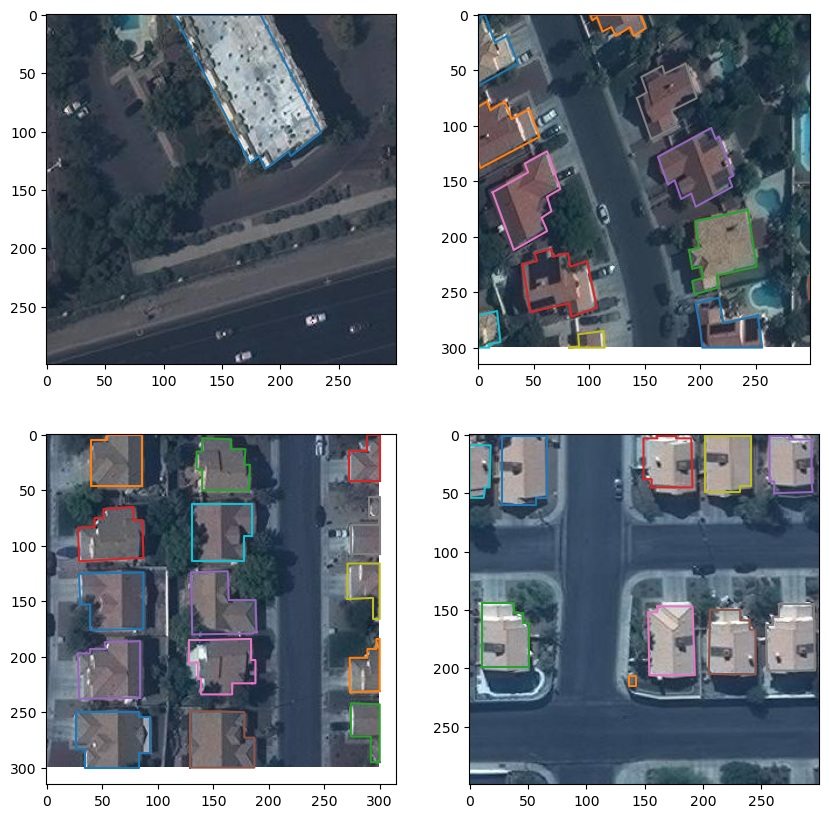

In [30]:
fig, m_axs = plt.subplots(2, 2, figsize = (10, 10))
## Outer loop will add sample image into a subplot.
## c_ax : contains the image.
## c_df : contains all the segments of a single image.
for c_ax, (c_id, c_df) in zip(m_axs.flatten(), grouped): # Group by function same as groupBy in mySql 
    img_data = imread(os.path.join(map_img_dir, c_df['file_name'].values[0]))
    c_ax.imshow(img_data)
    ### Inner loop : Add segmentation to the corresponding image. 
    ### One image can have multiple segments cuz there can be multiple buildings in a image.
    for i, (_, c_row) in enumerate(c_df.iterrows()):
        ## xy_vec : contains (x,y) coordinates of the segments.
        xy_vec = np.array(c_row['segmentation']).reshape((-1, 2))
        ## xy_vec[:, 0] : x coordinates
        ## xy_vec[:, 1] : y coordinates
        c_ax.plot(xy_vec[:, 0], xy_vec[:, 1], label = c_df['id_x'])
   

<h1 style= color:'red'> DON'T RUN THIS CODE CUZ THIS CODE GENERATE THE ANNOTATED IMAGES</h1>

OSError: [Errno 28] No space left on device: '../../model/data/instance-segmentation/train/annotated-images/000000008403.jpg'

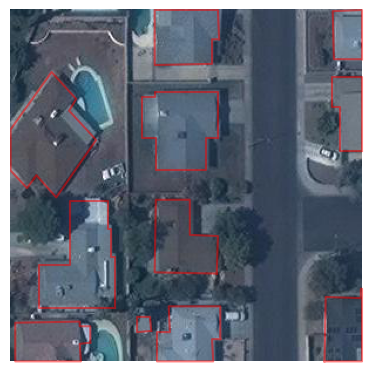

: 

In [31]:
# # Loop through each image in the full_df
# for c_id, c_df in full_df.groupby('image_id'):
#     # Read the image
#     img_data = imread(os.path.join(map_img_dir, c_df['file_name'].values[0]))

#     # Create a figure and axis to draw on
#     fig, ax = plt.subplots()
#     ax.imshow(img_data)

#     # Loop through segmentations for the current image
#     for _, c_row in c_df.iterrows():
#         # Extract the segmentation coordinates and reshape
#         xy_vec = np.array(c_row['segmentation']).reshape((-1, 2))
#         # Plot the segmentation on the image
#         ax.plot(xy_vec[:, 0], xy_vec[:, 1], color='red', alpha=0.5)

#     # Save the modified image with segmentations
#     output_image_path = os.path.join(output_dir, c_df['file_name'].values[0])
#     plt.axis('off')  # Turn off axis
#     plt.savefig(output_image_path, bbox_inches='tight', pad_inches=0)
#     plt.close(fig)  # Close the figure to free memory

# print("Segmented images saved to:", output_dir)

In [90]:
from matplotlib.path import Path
from skimage.color import label2rgb
def rows_to_segmentation(in_img, in_df):
    xx, yy = np.meshgrid(range(in_img.shape[0]), 
                range(in_img.shape[1]),
               indexing='ij')
    out_img = np.zeros(in_img.shape[:2])
    for _, c_row in in_df.iterrows():
        xy_vec = np.array(c_row['segmentation']).reshape((-1, 2))
        c_ax.plot(xy_vec[:, 0], xy_vec[:, 1], label = c_df['id_x'])
        xy_path = Path(xy_vec)
        out_img += xy_path.contains_points(np.stack([yy.ravel(), 
                                                     xx.ravel()], -1)).reshape(out_img.shape)
    return out_img

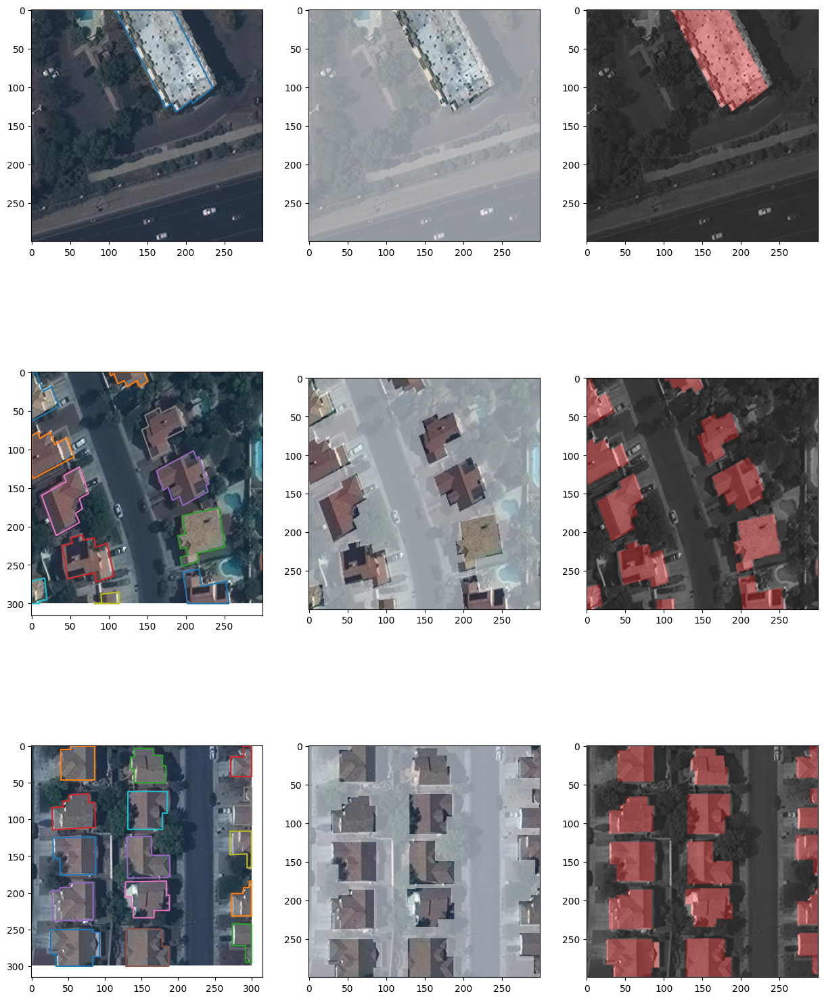

In [91]:
fig, m_axs = plt.subplots(3, 3, figsize = (15, 20))
for (c_ax, d_ax, f_ax), (c_id, c_df) in zip(m_axs,
                                      full_df.groupby('image_id')):
    img_data = imread(os.path.join(map_img_dir, c_df['file_name'].values[0]))
    c_ax.imshow(img_data)
    out_img = rows_to_segmentation(img_data, c_df)
    rgba_img = np.concatenate([img_data, 
                               np.clip(np.expand_dims(127*out_img+127, -1), 0, 255).astype(np.uint8)
                              ], -1)
    d_ax.imshow(rgba_img)
    
    f_ax.imshow(label2rgb(image=img_data, label=out_img, bg_label = 0))